# annotheta V1

- using colab annotator
- tensorflow official mask rcnn implementation backend
- using imantics to get the polygon points

Based on this notebook: https://colab.research.google.com/github/tensorflow/models/blob/master/research/object_detection/colab_tutorials/object_detection_tutorial.ipynb

# Mostly from the notebook

In [ ]:
#!pip install -U --pre tensorflow=="2.*"
!pip install tf_slim

     |████████████████████████████████| 352 kB 16.1 MB/s 


In [ ]:
!pip install pycocotools

In [ ]:
import os
import pathlib

if "models" in pathlib.Path.cwd().parts:
  while "models" in pathlib.Path.cwd().parts:
    os.chdir('..')
elif not pathlib.Path('models').exists():
  !git clone --depth 1 https://github.com/tensorflow/models

Cloning into 'models'...
remote: Enumerating objects: 3327, done.
remote: Counting objects: 100% (3327/3327), done.
remote: Compressing objects: 100% (2751/2751), done.
remote: Total 3327 (delta 883), reused 1387 (delta 526), pack-reused 0
Receiving objects: 100% (3327/3327), 34.30 MiB | 17.30 MiB/s, done.
Resolving deltas: 100% (883/883), done.


In [ ]:
%%bash
cd models/research/
protoc object_detection/protos/*.proto --python_out=.

In [ ]:
%%bash 
cd models/research
# The original notebook is broken: missing the following step of copying the setup.py
cp object_detection/packages/tf2/setup.py .
pip install .

Processing /content/models/research
  Created wheel for object-detection: filename=object_detection-0.1-py3-none-any.whl size=1690985 sha256=47d9807d60957cbd0489fecbe2faac374439f793e6957d16ad048f1c47afe4d8
  Stored in directory: /tmp/pip-ephem-wheel-cache-6yi1a361/wheels/fa/a4/d2/e9a5057e414fd46c8e543d2706cd836d64e1fcd9eccceb2329
  Created wheel for py-cpuinfo: filename=py_cpuinfo-8.0.0-py3-none-any.whl size=22257 sha256=0ca259e01273c7f92130512c6d241e30cb2cd6d13d8e0476d7484d8ec16b7669
  Stored in directory: /root/.cache/pip/wheels/d2/f1/1f/041add21dc9c4220157f1bd2bd6afe1f1a49524c3396b94401
  Created wheel for dill: filename=dill-0.3.1.1-py3-none-any.whl size=78544 sha256=b9a105f38076477a46c56904e716d70ca460482fb7e8ed4f8fa8db7f8ede74cc
  Stored in directory: /root/.cache/pip/wheels/a4/61/fd/c57e374e580aa78a45ed78d5859b3a44436af17e22ca53284f
  Created wheel for avro-python3: filename=avro_python3-1.10.2-py3-none-any.whl size=44010 sha256=5ab6bbe7cf754e8c49a9ded67cb63061ee9348f8c715327138

  DEPRECATION: A future pip version will change local packages to be built in-place without first copying to a temporary directory. We recommend you use --use-feature=in-tree-build to test your packages with this new behavior before it becomes the default.
   pip 21.3 will remove support for this functionality. You can find discussion regarding this at https://github.com/pypa/pip/issues/7555.
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
multiprocess 0.70.12.2 requires dill>=0.3.4, but you have dill 0.3.1.1 which is incompatible.
gym 0.17.3 requires cloudpickle<1.7.0,>=1.2.0, but you have cloudpickle 2.0.0 which is incompatible.
google-colab 1.0.0 requires requests~=2.23.0, but you have requests 2.27.1 which is incompatible.
datascience 0.10.6 requires folium==0.2.1, but you have folium 0.8.3 which is incompatible.


In [ ]:
import numpy as np
import os
import six.moves.urllib as urllib
import sys
import tarfile
import tensorflow as tf
import zipfile

from collections import defaultdict
from io import StringIO
from matplotlib import pyplot as plt
from PIL import Image, ImageDraw, ImageOps
from IPython.display import display

In [ ]:
from object_detection.utils import ops as utils_ops
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as vis_util

In [ ]:
# patch tf1 into `utils.ops`
utils_ops.tf = tf.compat.v1

# Patch the location of gfile
tf.gfile = tf.io.gfile

In [ ]:
def load_model(model_name):
  base_url = 'http://download.tensorflow.org/models/object_detection/'
  model_file = model_name + '.tar.gz'
  model_dir = tf.keras.utils.get_file(
    fname=model_name, 
    origin=base_url + model_file,
    untar=True)

  model_dir = pathlib.Path(model_dir)/"saved_model"

  model = tf.saved_model.load(str(model_dir))

  return model

In [ ]:
# List of the strings that is used to add correct label for each box.
PATH_TO_LABELS = 'models/research/object_detection/data/mscoco_label_map.pbtxt'
category_index = label_map_util.create_category_index_from_labelmap(PATH_TO_LABELS, use_display_name=True)

In [ ]:
# If you want to test the code with your images, just add path to the images to the TEST_IMAGE_PATHS.
PATH_TO_TEST_IMAGES_DIR = pathlib.Path('models/research/object_detection/test_images')
TEST_IMAGE_PATHS = sorted(list(PATH_TO_TEST_IMAGES_DIR.glob("*.jpg")))
TEST_IMAGE_PATHS

[PosixPath('models/research/object_detection/test_images/image1.jpg'),
 PosixPath('models/research/object_detection/test_images/image2.jpg'),
 PosixPath('models/research/object_detection/test_images/image3.jpg')]

In [ ]:
#model_url = 'http://download.tensorflow.org/models/object_detection/tf2/20200711/mask_rcnn_inception_resnet_v2_1024x1024_coco17_gpu-8.tar.gz'
model_name = "mask_rcnn_inception_resnet_v2_atrous_coco_2018_01_28"
masking_model = load_model(model_name)

727400448/727390102 [==============================] - 12s 0us/step
INFO:tensorflow:Saver not created because there are no variables in the graph to restore


In [ ]:
print(masking_model.signatures['serving_default'].inputs)

[<tf.Tensor 'image_tensor:0' shape=(None, None, None, 3) dtype=uint8>]


In [ ]:
masking_model.signatures['serving_default'].output_dtypes

{'detection_boxes': tf.float32,
 'detection_classes': tf.float32,
 'detection_masks': tf.float32,
 'detection_scores': tf.float32,
 'num_detections': tf.float32}

In [ ]:
masking_model.signatures['serving_default'].output_shapes

{'detection_boxes': TensorShape([None, 100, 4]),
 'detection_classes': TensorShape([None, 100]),
 'detection_masks': TensorShape([None, None, 33, 33]),
 'detection_scores': TensorShape([None, 100]),
 'num_detections': TensorShape([None])}

In [ ]:
def run_inference_for_single_image(model, image):
  image = np.asarray(image)
  # The input needs to be a tensor, convert it using `tf.convert_to_tensor`.
  input_tensor = tf.convert_to_tensor(image)
  # The model expects a batch of images, so add an axis with `tf.newaxis`.
  input_tensor = input_tensor[tf.newaxis,...]

  # Run inference
  model_fn = model.signatures['serving_default']
  output_dict = model_fn(input_tensor)

  # All outputs are batches tensors.
  # Convert to numpy arrays, and take index [0] to remove the batch dimension.
  # We're only interested in the first num_detections.
  num_detections = int(output_dict.pop('num_detections'))
  output_dict = {key:value[0, :num_detections].numpy() 
                 for key,value in output_dict.items()}
  output_dict['num_detections'] = num_detections

  # detection_classes should be ints.
  output_dict['detection_classes'] = output_dict['detection_classes'].astype(np.int64)
   
  # Handle models with masks:
  if 'detection_masks' in output_dict:
    # Reframe the the bbox mask to the image size.
    detection_masks_reframed = utils_ops.reframe_box_masks_to_image_masks(
              output_dict['detection_masks'], output_dict['detection_boxes'],
               image.shape[0], image.shape[1])      
    detection_masks_reframed = tf.cast(detection_masks_reframed > 0.5,
                                       tf.uint8)
    output_dict['detection_masks_reframed'] = detection_masks_reframed.numpy()
    
  return output_dict

In [ ]:
def show_inference(model, image_path):
  # the array based representation of the image will be used later in order to prepare the
  # result image with boxes and labels on it.
  image_np = np.array(Image.open(image_path))
  # Actual detection.
  output_dict = run_inference_for_single_image(model, image_np)
  # Visualization of the results of a detection.
  vis_util.visualize_boxes_and_labels_on_image_array(
      image_np,
      output_dict['detection_boxes'],
      output_dict['detection_classes'],
      output_dict['detection_scores'],
      category_index,
      instance_masks=output_dict.get('detection_masks_reframed', None),
      use_normalized_coordinates=True,
      line_thickness=8)

  display(Image.fromarray(image_np))

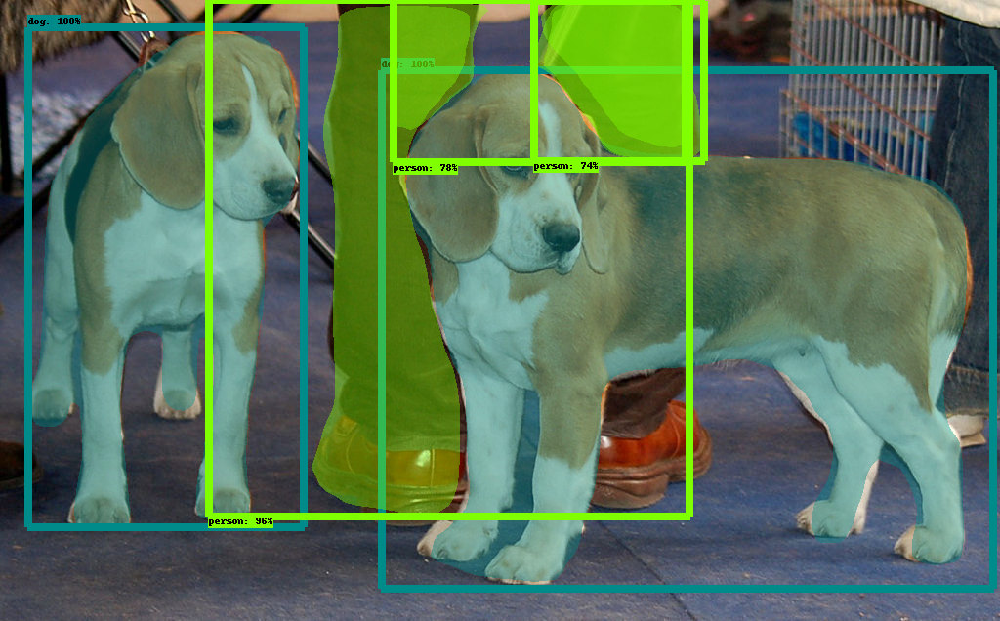

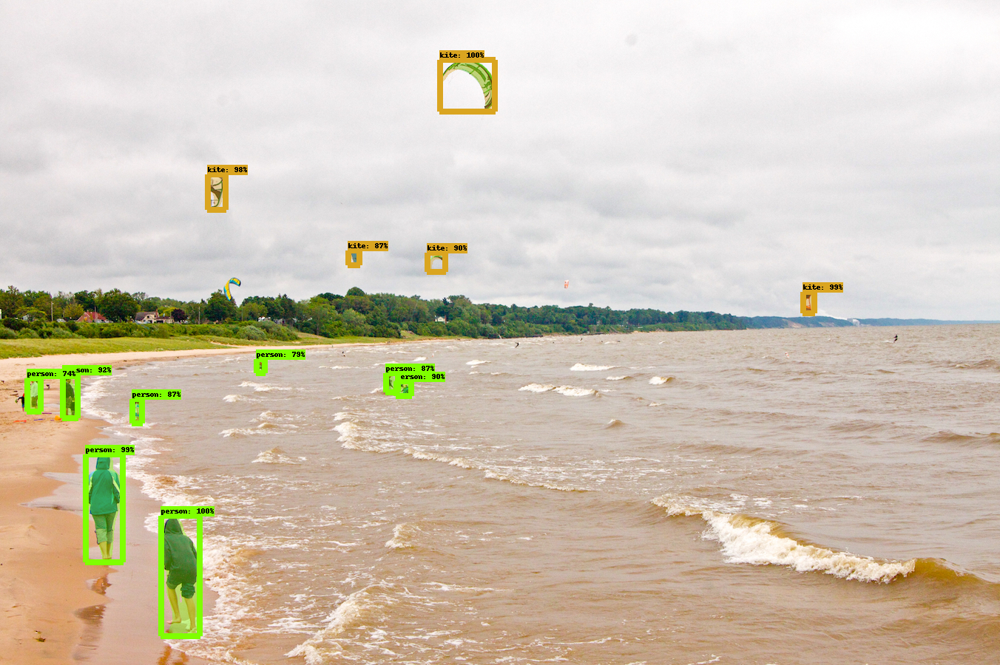

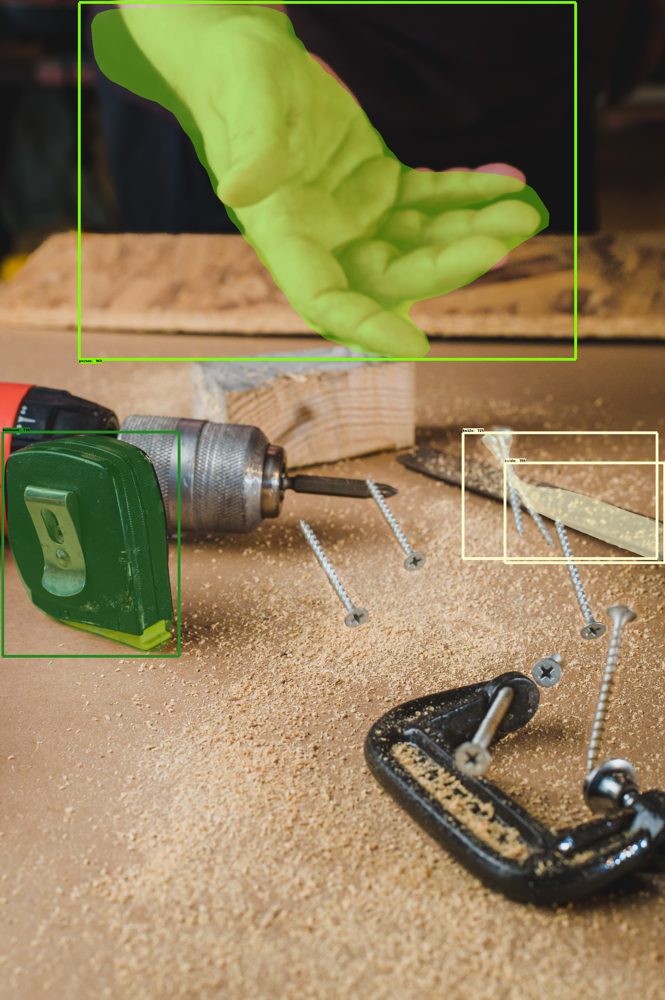

In [ ]:
for image_path in TEST_IMAGE_PATHS:
  show_inference(masking_model, image_path)

# Try ADE20K image

In [ ]:
!curl -O https://raw.githubusercontent.com/CSAILVision/ADE20K/main/dataset/ADE20K_2021_17_01/images/ADE/training/urban/street/ADE_train_00016869.jpg

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 1079k  100 1079k    0     0  1924k      0 --:--:-- --:--:-- --:--:-- 1924k


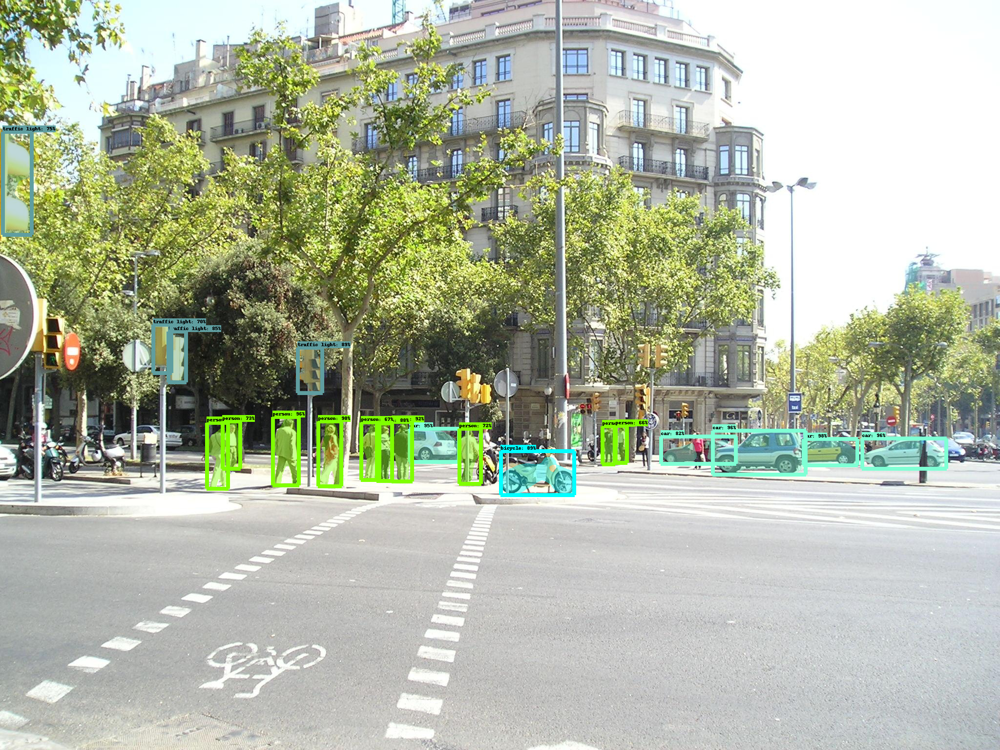

In [ ]:
image_path = 'ADE_train_00016869.jpg'
model = masking_model

# the array based representation of the image will be used later in order to prepare the
# result image with boxes and labels on it.
image_np = np.array(Image.open(image_path))

# Actual detection.
output_dict = run_inference_for_single_image(model, image_np)

# Visualization of the results of a detection.
vis_util.visualize_boxes_and_labels_on_image_array(
    image_np,
    output_dict['detection_boxes'],
    output_dict['detection_classes'],
    output_dict['detection_scores'],
    category_index,
    instance_masks=output_dict.get('detection_masks_reframed', None),
    use_normalized_coordinates=True,
    line_thickness=8)

display(Image.fromarray(image_np))

# Use colab annotator

In [ ]:
from object_detection.utils import colab_utils
from object_detection.utils import visualization_utils as viz_utils
box_storage_pointer = []

In [ ]:
im = Image.open(image_path)
width, height = im.size
im_np = np.array(im)
print(width, height, im_np.shape)
colab_utils.annotate([im_np], box_storage_pointer=box_storage_pointer)

2048 1536 (1536, 2048, 3)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

'--boxes array populated--'

<IPython.core.display.Javascript object>

In [ ]:
box_storage_pointer

[array([[0.55044444, 0.27050781, 0.65544444, 0.30078125]])]

845 554 1006 616


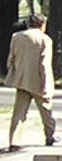

In [ ]:
bbox = box_storage_pointer[0][0]
xmin = int(bbox[0] * height)
ymin = int(bbox[1] * width)
xmax = int(bbox[2] * height)
ymax = int(bbox[3] * width)
print(xmin, ymin, xmax, ymax)
image_np = im_np[xmin:xmax, ymin:ymax, :].copy()
display(Image.fromarray(image_np))

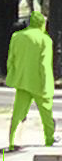

In [ ]:
# Run inference.
output_dict = run_inference_for_single_image(masking_model, image_np)

# Visualize results.
vis_util.visualize_boxes_and_labels_on_image_array(
    image_np,
    output_dict['detection_boxes'],
    output_dict['detection_classes'],
    output_dict['detection_scores'],
    category_index,
    instance_masks=output_dict.get('detection_masks_reframed', None),
    use_normalized_coordinates=True,
    skip_boxes=True,
    skip_labels=True,
    skip_scores=True)

display(Image.fromarray(image_np))

In [ ]:
output_dict

{'detection_boxes': array([[0.06750587, 0.06122145, 0.933275  , 0.9136498 ]], dtype=float32),
 'detection_classes': array([1]),
 'detection_masks': array([[[0.00594256, 0.00323824, 0.00370736, ..., 0.00492156,
          0.00433427, 0.00604759],
         [0.00381417, 0.00424199, 0.00573434, ..., 0.00740504,
          0.00564149, 0.00414442],
         [0.00399665, 0.00571148, 0.00764298, ..., 0.01054867,
          0.00667735, 0.00458594],
         ...,
         [0.01247894, 0.02715482, 0.07157797, ..., 0.7175117 ,
          0.36519003, 0.1540893 ],
         [0.02699803, 0.05570911, 0.13341038, ..., 0.29046974,
          0.15205966, 0.06990979],
         [0.05088768, 0.08955093, 0.22589585, ..., 0.02230984,
          0.01582267, 0.01378891]]], dtype=float32),
 'detection_masks_reframed': array([[[0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         ...,
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..

# Try imantics to get the polygon

In [ ]:
!pip install imantics

  Created wheel for imantics: filename=imantics-0.1.12-py3-none-any.whl size=16033 sha256=ea9732f099166ea5233164f7bc770a41f39bc5f0440db2b35a140367fed31de2
  Stored in directory: /root/.cache/pip/wheels/da/7c/3e/296fe3ed4eb3bd713e91dee0d0549f12f316d49939a64bdc96
Successfully built imantics


In [ ]:
!pip uninstall --yes opencv-python-headless==4.5.5.64
!pip install opencv-python==4.1.2.30

     |████████████████████████████████| 28.3 MB 1.5 MB/s 
  Attempting uninstall: opencv-python
    Found existing installation: opencv-python 4.5.5.64
    Uninstalling opencv-python-4.5.5.64:
      Successfully uninstalled opencv-python-4.5.5.64
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
albumentations 0.1.12 requires imgaug<0.2.7,>=0.2.5, but you have imgaug 0.2.9 which is incompatible.


In [ ]:
from imantics import Polygons, Mask
m = output_dict['detection_masks_reframed'][0]
polygons = Mask(m).polygons()
print(m.shape, len(polygons.points[0]), len(polygons.segmentation[0]))

(161, 62) 128 256


(62, 161) [186 483]


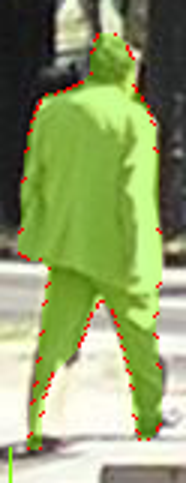

In [ ]:
imbox = Image.fromarray(image_np)
draw = ImageDraw.Draw(imbox)
draw.point(polygons.segmentation[0], fill='red')
newsize = 3*np.array(imbox.size)
print(imbox.size, newsize)
imzoom = imbox.resize(newsize)
display(imzoom)